<a href="https://colab.research.google.com/github/pranavitellam/Currency-convertor/blob/main/Dataset2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python-headless

In [ ]:
import cv2
import numpy as np
import glob
import os
from google.colab.patches import cv2_imshow

In [ ]:
images = glob.glob('*.[jJ][pP][gG]') + glob.glob('*.[jJ][pP][eE][gG]')

print("Total images found:", len(images))
print(images)

Total images found: 22
['t.jpeg', 'e.jpeg', 'g.jpeg', 'o.jpeg', 'v.jpeg', 's.jpeg', 'h.jpeg', 'c.jpeg', 'd.jpeg', 'f.jpeg', 'j.jpeg', 'i.jpeg', 'b.jpeg', 'p.jpeg', 'k.jpeg', 'q.jpeg', 'u.jpeg', 'l.jpeg', 'n.jpeg', 'r.jpeg', 'a.jpeg', 'm.jpeg']


In [ ]:
CHECKERBOARD = (7, 6)  # inner corners

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

In [ ]:
objp = np.zeros((CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)

objpoints = []
imgpoints = []

Processing: t.jpeg
❌ Corners NOT detected in: t.jpeg
Processing: e.jpeg


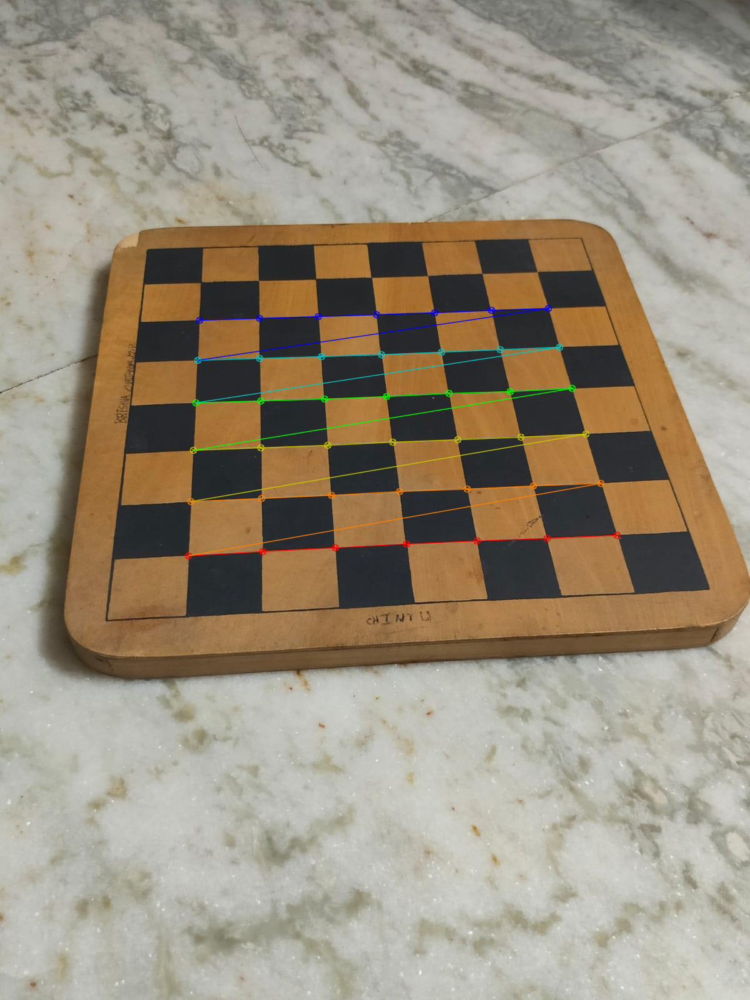

Processing: g.jpeg
❌ Corners NOT detected in: g.jpeg
Processing: o.jpeg
❌ Corners NOT detected in: o.jpeg
Processing: v.jpeg


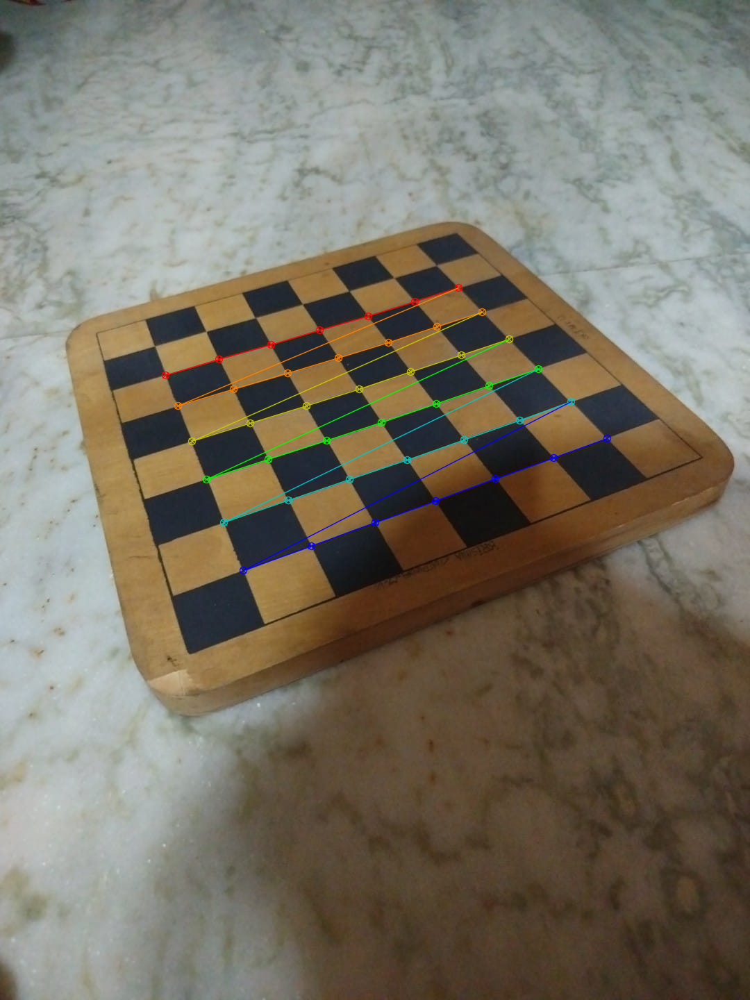

Processing: s.jpeg
❌ Corners NOT detected in: s.jpeg
Processing: h.jpeg
❌ Corners NOT detected in: h.jpeg
Processing: c.jpeg


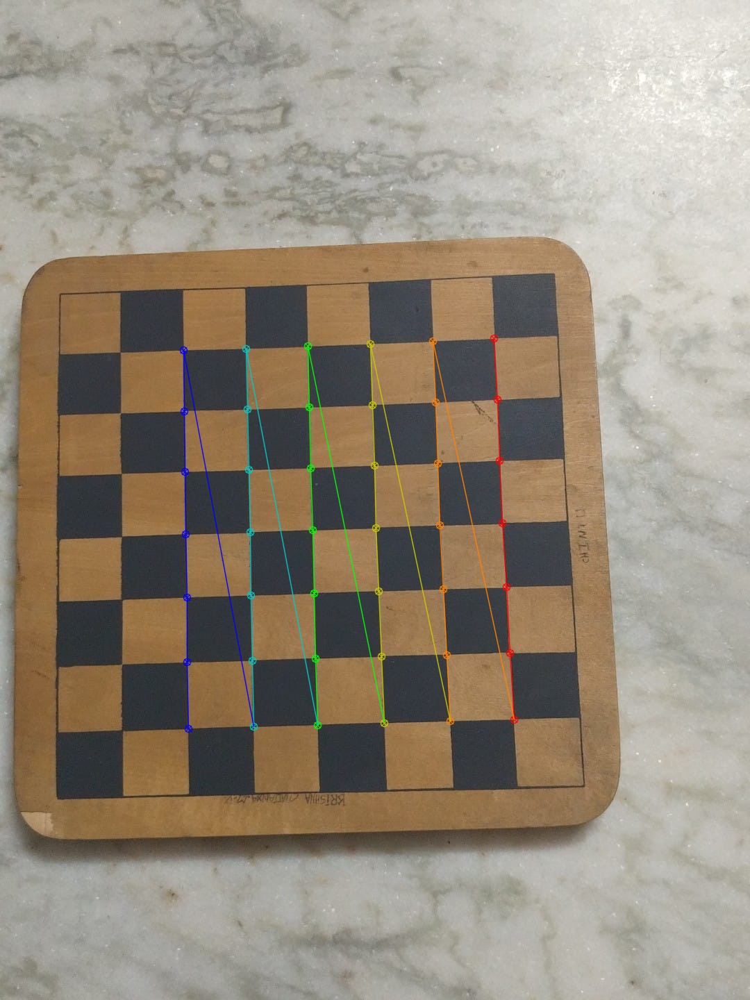

Processing: d.jpeg
❌ Corners NOT detected in: d.jpeg
Processing: f.jpeg


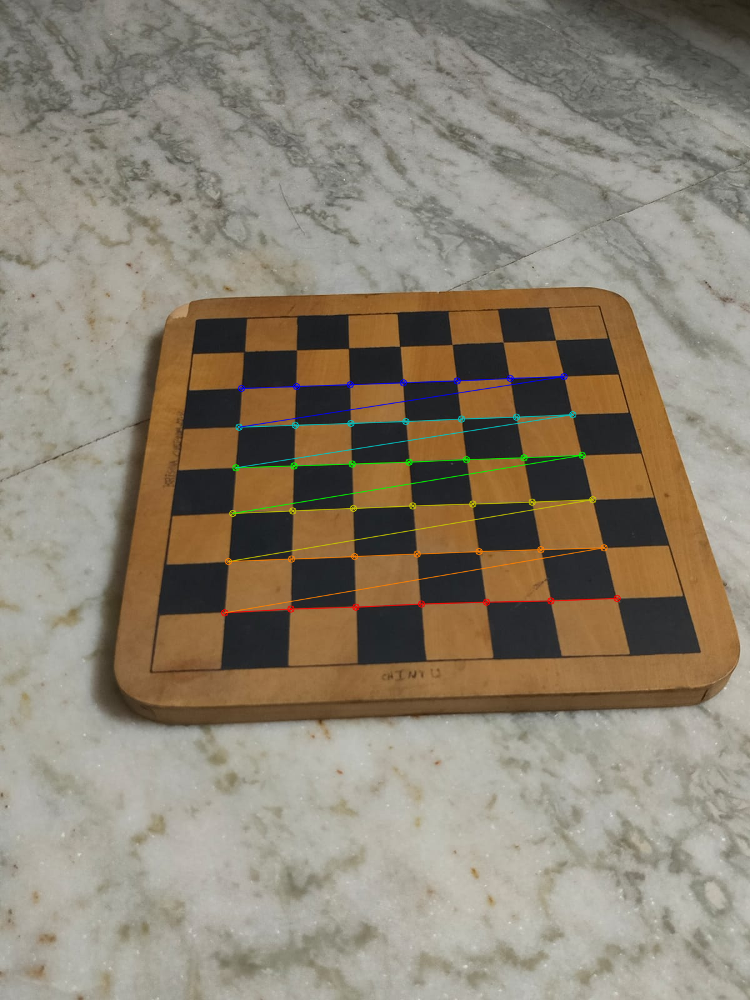

Processing: j.jpeg


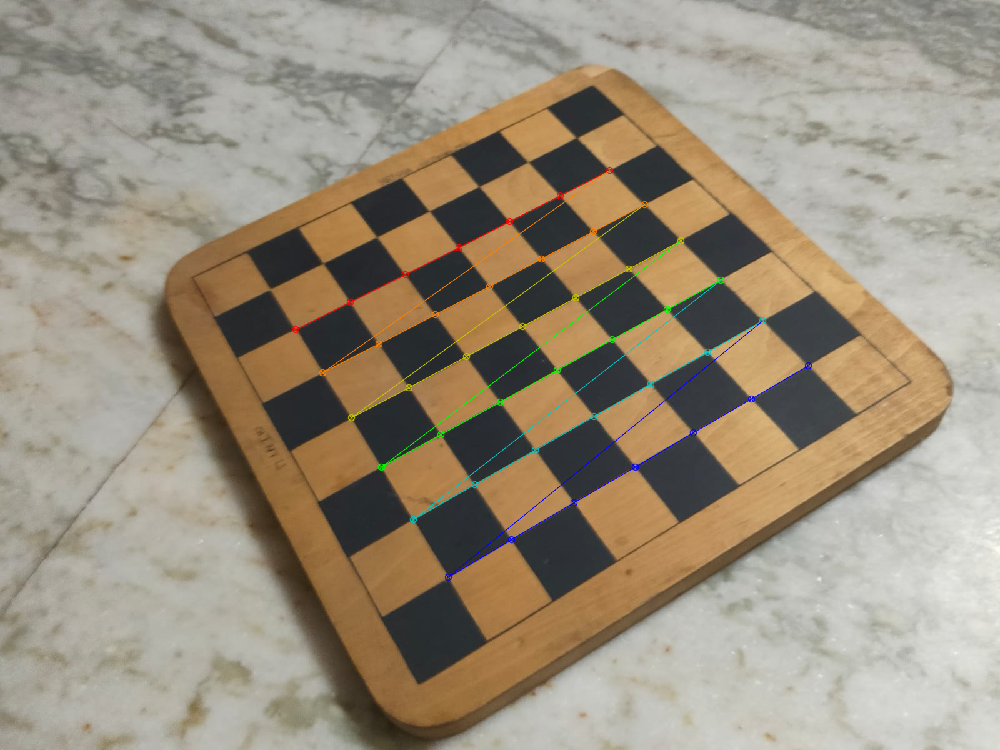

Processing: i.jpeg
❌ Corners NOT detected in: i.jpeg
Processing: b.jpeg
❌ Corners NOT detected in: b.jpeg
Processing: p.jpeg
❌ Corners NOT detected in: p.jpeg
Processing: k.jpeg
❌ Corners NOT detected in: k.jpeg
Processing: q.jpeg
❌ Corners NOT detected in: q.jpeg
Processing: u.jpeg
❌ Corners NOT detected in: u.jpeg
Processing: l.jpeg
❌ Corners NOT detected in: l.jpeg
Processing: n.jpeg
❌ Corners NOT detected in: n.jpeg
Processing: r.jpeg
❌ Corners NOT detected in: r.jpeg
Processing: a.jpeg
❌ Corners NOT detected in: a.jpeg
Processing: m.jpeg
❌ Corners NOT detected in: m.jpeg

✅ Valid images used: 5


In [ ]:
for fname in images:
    print("Processing:", fname)

    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)

    if ret:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        img_draw = cv2.drawChessboardCorners(img.copy(), CHECKERBOARD, corners2, ret)
        cv2_imshow(img_draw)

    else:
        print("❌ Corners NOT detected in:", fname)

print("\n✅ Valid images used:", len(objpoints))

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    objpoints, imgpoints, gray.shape[::-1], None, None
)

print("\n📷 Camera Matrix:\n", mtx)
print("\n🔧 Distortion Coefficients:\n", dist)


📷 Camera Matrix:
 [[1.30193013e+03 0.00000000e+00 6.24248989e+02]
 [0.00000000e+00 1.32350369e+03 8.92000055e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

🔧 Distortion Coefficients:
 [[ 0.13847948 -2.0290303  -0.03099278  0.00703805  4.19323186]]


In [ ]:
total_error = 0

for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
    total_error += error

mean_error = total_error / len(objpoints)

print("\n📊 Mean Reprojection Error:", mean_error)


📊 Mean Reprojection Error: 0.3659877086339381



Original Image:


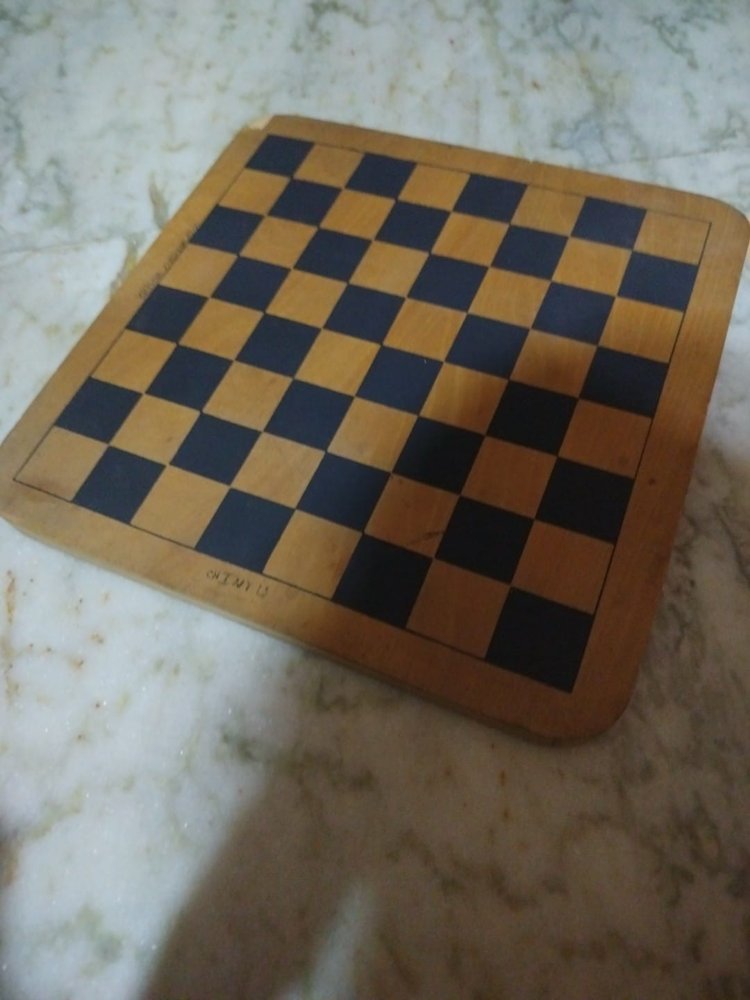


Undistorted Image:


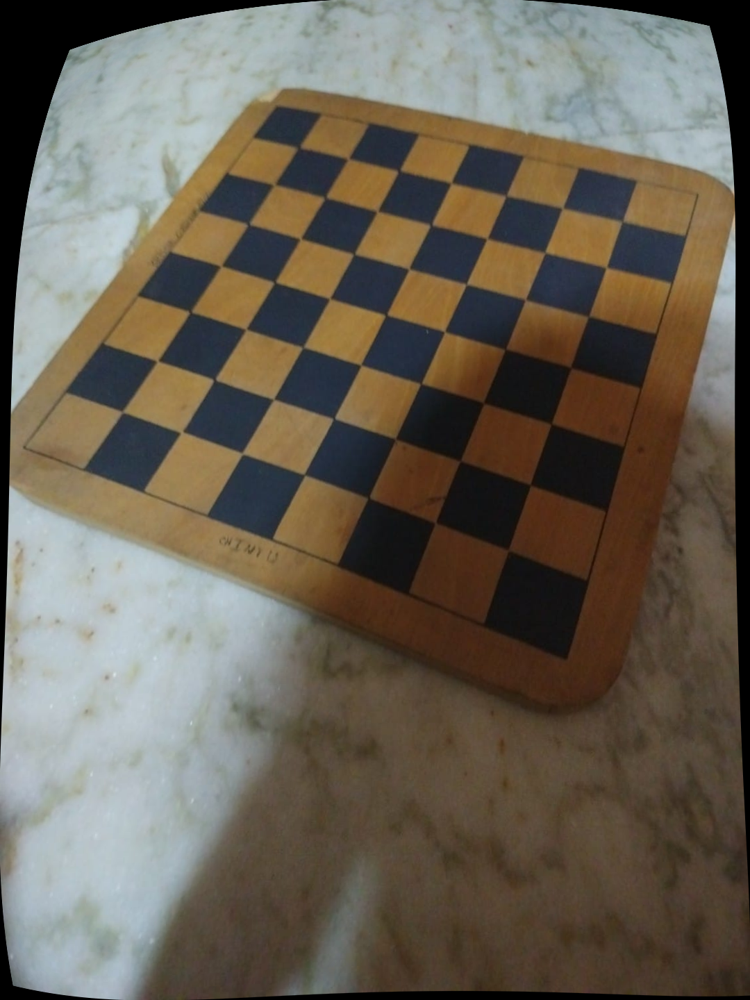

In [ ]:
img = cv2.imread(images[0])
h, w = img.shape[:2]

newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

print("\nOriginal Image:")
cv2_imshow(img)

print("\nUndistorted Image:")
cv2_imshow(dst)

In [ ]:
np.savez("calibration_data.npz",
         camera_matrix=mtx,
         distortion=dist)

print("\n💾 Calibration data saved!")


💾 Calibration data saved!
